In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer.pitch import Pitch
from mplsoccer.pitch import VerticalPitch
import seaborn as sns
import matplotlib as mpl
from scipy.ndimage import gaussian_filter
from highlight_text import fig_text
import ipywidgets as widgets

#Read in the data
df = pd.read_csv('Footballdata/Others/Chelsea2/Chelsea22_23.csv', encoding='latin-1')

#Adjust for pitch size
df['x'] = df['x']*1.2
df['y'] = df['y']*.8
df['endX'] = df['endX']*1.2
df['endY'] = df['endY']*.8

#Combo box, choose team
options = df["teamId"].unique()
options = options.tolist()

options = [x for x in options if str(x) != 'nan']
teamlist = widgets.Combobox(
    placeholder='Enter a team',
    options=options,
    description='Team:',
    ensure_option=True,
    disabled=False
)
teamlist

C:\Users\user\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3185: DtypeWarning: Columns (34) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


Combobox(value='', description='Team:', ensure_option=True, options=('30', 'Chelsea', '31', '19', '14', '18', …

In [2]:
#Retrieve Team
team = teamlist.value

#Retrieve Opposition team (only use when there's two available teams for selection)
oppo = df.loc[(df['teamId']!= team)]
oppo = oppo['teamId'].unique()
oppo = oppo[0]

#Filter for team
df = df[df['teamId']== team]

#Filter for points beyond the half-way point and excludes corners and throw ins
df = df.loc[(df['x'].between(60.1,119)) &
            (df['y'].between(0.1,79.9))]

#Filter for points beyond the final third
#df = df.loc[df['x']>=79.9]

#Create new varaible to find out if the touch or pass occured in the final 3rd
df['right']=np.where((df['y'].between(0,26.6)) & 
                    ((df['isTouch']== True) | 
                    ((df['type_displayName']=='Pass') & df['outcomeType_displayName'] == 'Successful')), 1, 0)

df['center']=np.where((df['y'].between(26.7,53.3)) & 
                    ((df['isTouch']== True) | 
                    ((df['type_displayName']=='Pass') & df['outcomeType_displayName'] == 'Successful')), 1, 0)

df['left']=np.where((df['y'].between(53.4,80)) & 
                    ((df['isTouch']== True) | 
                    ((df['type_displayName']=='Pass') & df['outcomeType_displayName'] == 'Successful')), 1, 0)
"""
#Create new varaible to find out if the touch or pass occured in the final 3rd
df['right']=np.where((df['y'].between(0,17.5)) & 
                    ((df['isTouch']== True) | 
                    ((df['type/displayName']=='Pass') & df['outcomeType/displayName'] == 'Successful')), 1, 0)

df['center']=np.where((df['y'].between(17.51,62.49)) & 
                    ((df['isTouch']== True) | 
                    ((df['type/displayName']=='Pass') & df['outcomeType/displayName'] == 'Successful')), 1, 0)

df['left']=np.where((df['y'].between(62.5,80)) & 
                    ((df['isTouch']== True) | 
                    ((df['type/displayName']=='Pass') & df['outcomeType/displayName'] == 'Successful')), 1, 0)
"""
#Sum of touches from all 3 sides, and identify the percentage
Right = df['right'].sum()
Center = df['center'].sum()
Left = df['left'].sum()

dfright = round(Right/(Right+Center+Left)*100,1)
dfcenter = round(Center/(Right+Center+Left)*100,1)
dfleft = round(Left/(Right+Center+Left)*100,1)

#Turn them into strings
dfright=str(dfright)
dfcenter=str(dfcenter)
dfleft=str(dfleft)

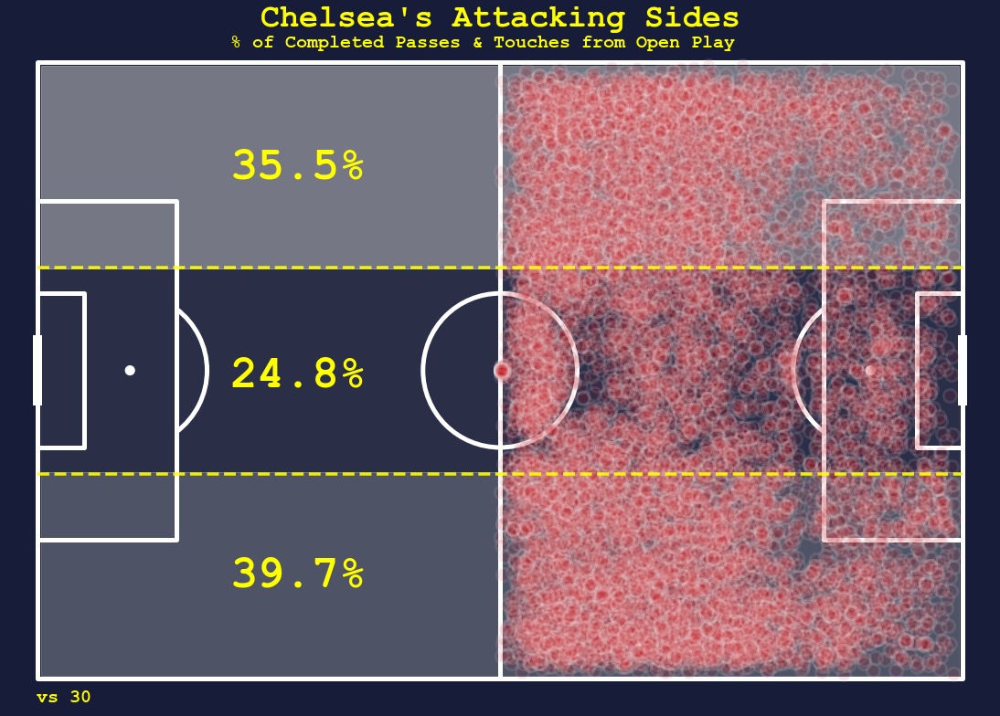

In [3]:
#Make the pitch
pitch = Pitch(pitch_type='statsbomb', pitch_color='#171c38', line_color='white',linewidth=5, spot_scale=0.005)
fig, ax = pitch.draw(figsize=(16, 11), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#171c38')
mpl.rcParams['figure.dpi'] = 300

#inverse y-axis
plt.gca().invert_yaxis()

#plot the pass locations for home side
plt.scatter(df.x, df.y, marker='o', s=200, c='#c11720', alpha=0.1,
            linewidth = 3, edgecolor='white')

#Draw line
ax.plot([0,120], [26.6, 26.6], c='yellow', lw=3.5, ls='--', zorder=19, alpha=0.9)

ax.plot([0,120], [53.3, 53.3], c='yellow', lw=3.5, ls='--', zorder=19, alpha=0.9)


#set title
plt.title(team + "'s Attacking Sides",color='yellow',size=35, 
          fontfamily = "Courier New", fontweight = "bold")

ax.text(25,82, '% of Completed Passes & Touches from Open Play', fontsize=20, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(25,65, dfleft+"%", fontsize=50, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(25,38, dfcenter+"%", fontsize=50, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(25,12, dfright+"%", fontsize=50, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")
"""
ax.text(-0.1, -2.5, 'Made by @chunhang7', va='center', ha='left', fontsize=20, color='yellow',
        fontweight = "bold",fontfamily = "Courier New")

ax.text(93, -2.5, 'vs '+ oppo, va='center', ha='left', fontsize=20, color='yellow',
        fontweight = "bold",fontfamily = "Courier New")"""

ax.text(-0.1, -2.5, 'vs '+oppo, va='center', ha='left', fontsize=20, color='yellow',
        fontweight = "bold",fontfamily = "Courier New")

#shade
plt.axvspan(0.5,119.5,ymin=0.05,ymax=0.35,color='lightgrey',zorder=-1,alpha=0.3)

plt.axvspan(0.5,119.5,ymin=0.35,ymax=0.65,color='lightgrey',zorder=-1,alpha=0.1)

plt.axvspan(0.5,119.5,ymin=0.65,ymax=0.95,color='lightgrey',zorder=-1,alpha=0.5)

plt.show()

# Vertical Half Pitch

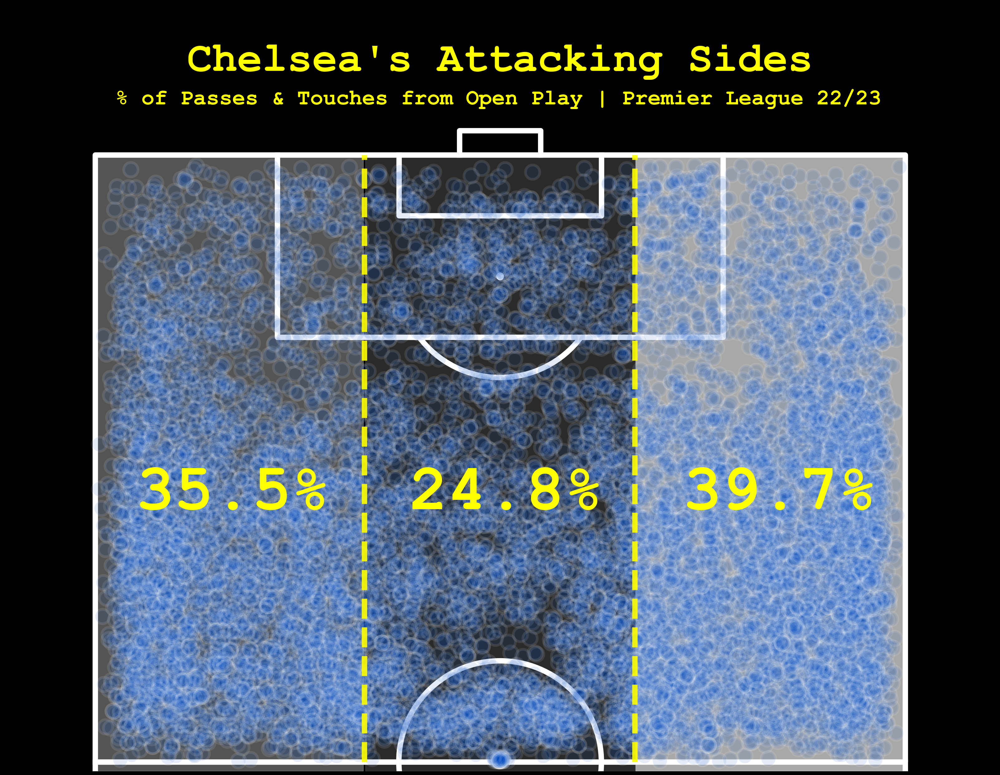

In [20]:
pitch = VerticalPitch(pad_bottom=0.9,  # pitch extends slightly below halfway line
                      half=True,       # half of a pitch
                      goal_type='box',
                      pitch_type='statsbomb', 
                      pitch_color='#000000', 
                      line_color='white',
                      linewidth=10, 
                      spot_scale=0.003)

mpl.rcParams['figure.dpi'] = 125
fig,ax = pitch.draw(figsize=(30, 20), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#000000')

plt.gca().invert_xaxis()

#Touch
pitch.scatter(df.x, df.y, s= 700, c = "#004bc4", edgecolors='w', alpha=0.1, 
              zorder=3, linewidth = 5, marker='o', ax=ax)

#Draw line
ax.plot([53.4, 53.4], [60,120], c='yellow', lw=10, ls='--', zorder=19, alpha=0.9)

ax.plot([26.7, 26.7], [60,120], c='yellow', lw=10, ls='--', zorder=19, alpha=0.9)

#set title
plt.title("\n"+team + "'s Attacking Sides\n",color='yellow',size=77, 
          fontfamily = "Courier New", fontweight = "bold")

ax.text(78,125, '% of Passes & Touches from Open Play | Premier League 22/23', fontsize=40, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(76,85, dfleft+"%", fontsize=120, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(49,85, dfcenter+"%", fontsize=120, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(22,85, dfright+"%", fontsize=120, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

#shade
plt.axvspan(0, 26.6, ymax=0.94, color='lightgrey',zorder=-1,alpha=0.8)
plt.axvspan(26.7,53.3, ymax=0.94, color='lightgrey',zorder=-1,alpha=0.2)
plt.axvspan(53.5, 80, ymax=0.94, color='lightgrey',zorder=-1,alpha=0.4)

#Spacing
ax.text(-5,120, 'Space', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')
ax.text(89,120, 'Space', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')

#ax.text(40,50, 'Space', fontsize=25, color='w',fontweight='bold',fontfamily='Courier New')

plt.show()

# Vertical Full Pitch

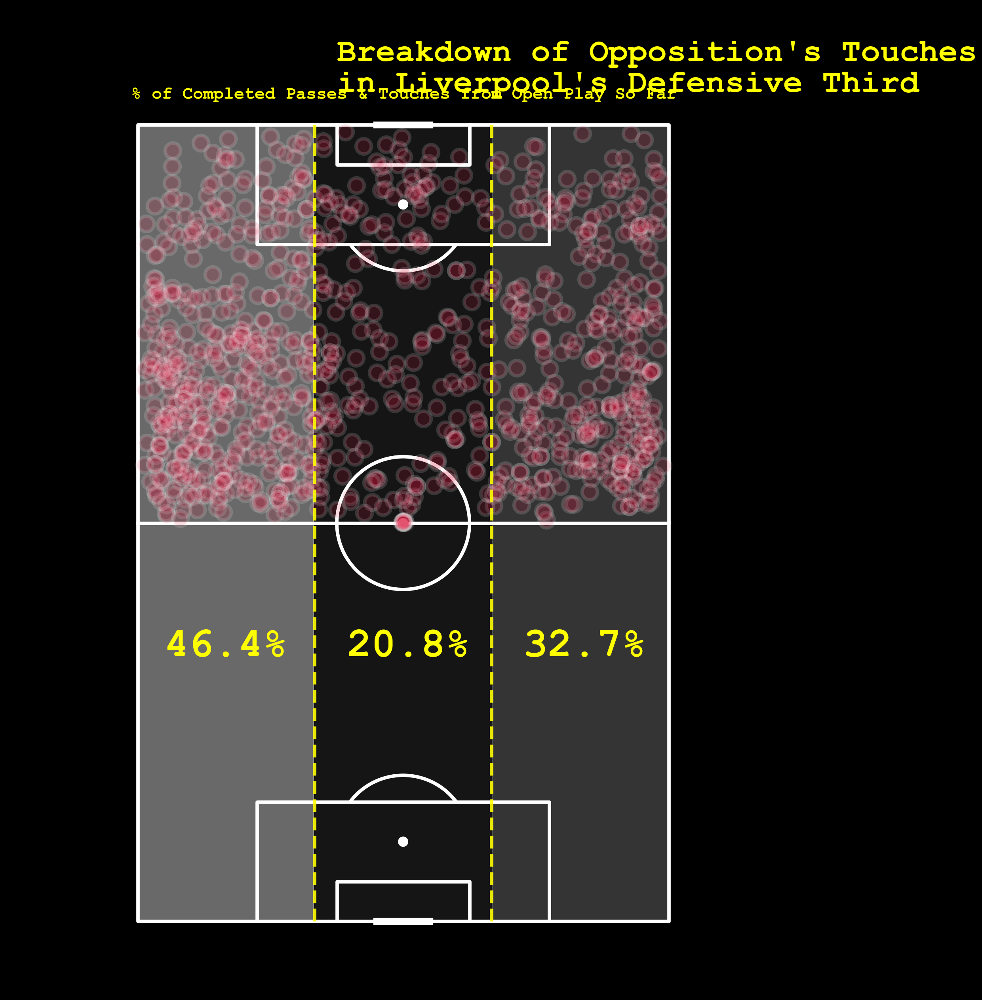

In [9]:
#Set up pitch
pitch = VerticalPitch(pitch_type='statsbomb', 
                  pitch_color='#000000', line_color='white',half = False,
                  line_zorder=1, linewidth=5, spot_scale=0.006)

fig,ax = pitch.draw(figsize=(30, 20), constrained_layout=False, tight_layout=True)
fig.set_facecolor('#000000')

#Inverse the y-axis
plt.gca().invert_xaxis()

#Touch
pitch.scatter(df.x, df.y, s= 500, c='crimson', edgecolors='w', alpha=0.15,
              zorder=3, linewidth = 5, marker='o', ax=ax)

#Draw line
ax.plot([53.4,53.4], [0,120], c='yellow', lw=5, ls='--', zorder=19, alpha=0.9)

ax.plot([26.7, 26.7], [0,120], c='yellow', lw=5, ls='--', zorder=19, alpha=0.9)

#Title
plt.text(50,125,"Breakdown of Opposition's Touches\nin Liverpool's Defensive Third",color='yellow',
          size=47, fontfamily = "Courier New", fontweight = "bold")

ax.text(81,124, '% of Completed Passes & Touches from Open Play So Far', fontsize=25, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

#Space
ax.text(55,137, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')
ax.text(-12, -10, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')
ax.text(100, -10, 'Space', va='center', ha='left', fontsize=25, color='black',fontweight='bold',fontfamily='Courier New')

#Text
ax.text(76,40, dfleft+"%", fontsize=60, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(48.5,40, dfcenter+"%", fontsize=60, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

ax.text(22,40, dfright+"%", fontsize=60, 
       color='yellow',fontweight = "bold",fontfamily = "Courier New")

#shade
plt.axvspan(0,26.6, ymin=0.03, ymax=0.97, color='lightgrey',zorder=-1,alpha=0.25)
plt.axvspan(26.7,53.3, ymin=0.03, ymax=0.97, color='lightgrey',zorder=-1,alpha=0.1)
plt.axvspan(53.5,80, ymin=0.03, ymax=0.97, color='lightgrey',zorder=-1,alpha=0.5)

plt.show()